# 🧱 DCGAN - Bricks Data

In this notebook, we'll walk through the steps required to train your own DCGAN on the bricks dataset

In [10]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

# Set the GPU device to use
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

%cd /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks

from utils import display, sample_batch

%env JUPYTER_PORT=8888
%env TENSORBOARD_PORT=6006

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks
env: JUPYTER_PORT=8888
env: TENSORBOARD_PORT=6006


## 0. Parameters <a name="parameters"></a>

In [11]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 300
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [12]:
train_data = utils.image_dataset_from_directory(
    "/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/lego-brick-images",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 40000 files belonging to 1 classes.


In [13]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [14]:
train_sample = sample_batch(train)

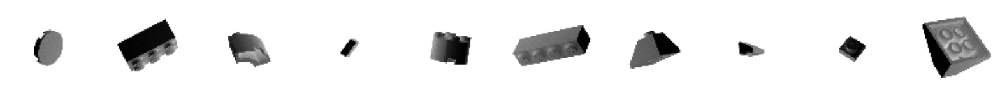

In [15]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

## Mathematical Owerview

In a *Generative Adversarial Network* model, we have a *Generator*, whose goal is to generate data, and a *Discriminator* whose goal is the determine if the data is recieves is real or not. The idea is that we train them in parallel so that the generator is producing high-quality data and the discriminator is getting more adept at determining real from fake. Of course, we'd like to generator to eventually overtake the discriminator so that after some time the data generated is so close to the real data that the discriminator has no idea which is real. In this notebook, we are using a deep neural network with convolutions, giving us a *Deep Convolutional Generative Adversarial Network* (DCGAN) model.

As such, our architecture looks like:

<div style='text-align: center;'>
    <img src='/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/Graphics/DCGAN.png' alt='DCGAN' width='750'>
</div>

Now, the generator is essentially just a VAE from before. We feed it some data from the latent space, $\mathbf{z} \sim \mathcal{N}(0, \mathbf{I}_d)$, and it outputs some datum, an image in our case. That is then fed into the discriminator, along with real data, and the discriminator outputs a value $\hat{y} \in [0,1]$. We then use *Binary Cross Entropy* as a loss. As such, we can formulate our model as:

$$ \mathbf{x}_{Fake} = G_{\phi}(\mathbf{z}), \mathbf{z} \sim \mathcal{N}(0, \mathbf{I}_d) $$
$$ \hat{y}_{Fake} = D_{\theta}(\mathbf{x}_{Fake}) $$

The standard formulation for this loss function is:

$$ \mathcal{L}_{BCE}(Y, \hat{Y}) = \frac{1}{|\hat{Y}|} \sum_{i \in \{1, ..., |\hat{Y}|\}} (y_i \log(\hat{y}_i) + (1-y_i)\log(1-\hat{y}_i)) $$

In our case, this means:

$$ \hat{Y}_{Fake} = D_{\theta}(X_{Fake}) $$
$$ \hat{Y}_{Real} = D_{\theta}(X_{Real}) $$

Now, we will have two losses with the same form, one for each piece of the DCGAN. For the generator, our loss is simply $\mathcal{L}_{G} = \mathcal{L}_{BCE}(Y_{Real}, \hat{Y}_{Fake})$ and our loss for the discriminator is an average over a noise-perturbed batch of real and fake predictions:

$$ \mathcal{L}_{D} = \frac{1}{2} \left( \mathcal{L}_{BCE}(Y_{RealP}, \hat{Y}_{Real}) + \mathcal{L}_{BCE}(Y_{FakeP}, \hat{Y}_{Fake}) \right) $$

We note that $Y_{Real}$ is just a vector of $1$ and $Y_{Fake}$ is a vector of $0$, so we perturb them with:

$$ \texttt{real\_labels = tf.ones\_like(real\_predictions)} $$
$$ \texttt{real\_noisy\_labels = real\_labels + NOISE\_PARAM * tf.random.uniform(tf.shape(real\_predictions))} $$

In [16]:
# Example of what the noisy labeling does

real_predictions = tf.ones((10,))
real_labels = tf.ones_like((real_predictions))
real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(tf.shape(real_predictions))
print(f'Example of real_labels {real_labels}')
print(f'Example of real_noisy_labels {real_noisy_labels}')

Example of real_labels [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Example of real_noisy_labels [1.0878977 1.0301526 1.0132697 1.0656615 1.0358084 1.0614061 1.0087831
 1.0241524 1.0527291 1.0189615]


In [17]:
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)) # Recieves images
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x) # By this point, this tensor is 1x1x1, so we don't really need a dense layer. We want a single ouput in [0,1]

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

'''
Note, we are using strides of 2 to reduce the size of the image down to one while using the filters to increase the channels up to 512 before collapsing to 
1x1x1.
'''

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        1024      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 128)      512       
 ormalization)                                                   
                                                             

'\nNote, we are using strides of 2 to reduce the size of the image down to one while using the filters to increase the channels up to 512 before collapsing to \n1x1x1.\n'

In [18]:
generator_input = layers.Input(shape=(Z_DIM,)) # Recieves a random vector length Z_DIM (in this case, 100)
x = layers.Reshape((1, 1, Z_DIM))(generator_input) # Reshaping it to 1x1xZ_DIM so we can apply the Conv2DTranspose operation on it and build
# an image
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x) 
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x) # We now have an image of size 64x64x1
generator = models.Model(generator_input, generator_output)
generator.summary()

'''
Note, we are using the filters (starting at 512 and reducing to CHANNELS) and strides of 2 to build up our tensor of 1x1xZ_DIM to 64x64x1.
'''

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_3 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097

'\nNote, we are using the filters (starting at 512 and reducing to CHANNELS) and strides of 2 to build up our tensor of 1x1xZ_DIM to 64x64x1.\n'

In [19]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        ) # Draws a batch of vectors from a multi-variate normal of size latent_dim

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            ) # Now have generated images from the random_latent_vectors
            real_predictions = self.discriminator(real_images, training=True) # Discriminator predictions on the real data (we'd like these to be all 1)
            fake_predictions = self.discriminator(
                generated_images, training=True
            ) # Discriminator predictions on the fake images (we'd like these to be all 0)

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        # Gradients and Parameter updating
        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics} # Returns a dictionary of results

In [20]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [21]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [22]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [23]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5 # Putting the image values 0 and 255
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_%03d.png" % (epoch),
        )

Epoch 1/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1583 - d_real_acc: 0.9311 - d_fake_acc: 0.9369 - d_acc: 0.9340 - g_loss: 7.7827 - g_acc: 0.0632
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_000.png


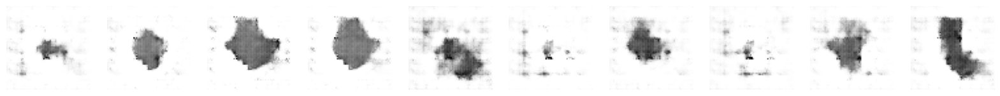

313/313 [==============================] - 327s 1s/step - d_loss: -0.1583 - d_real_acc: 0.9311 - d_fake_acc: 0.9369 - d_acc: 0.9340 - g_loss: 7.7827 - g_acc: 0.0632
Epoch 2/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1168 - d_real_acc: 0.8830 - d_fake_acc: 0.8878 - d_acc: 0.8854 - g_loss: 5.9764 - g_acc: 0.1122
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_001.png


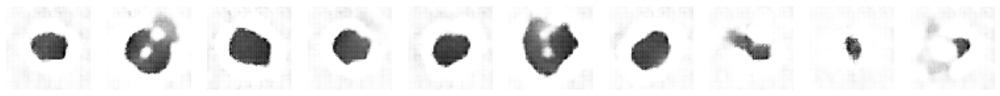

313/313 [==============================] - 324s 1s/step - d_loss: 0.1168 - d_real_acc: 0.8830 - d_fake_acc: 0.8878 - d_acc: 0.8854 - g_loss: 5.9764 - g_acc: 0.1122
Epoch 3/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0769 - d_real_acc: 0.8897 - d_fake_acc: 0.8888 - d_acc: 0.8893 - g_loss: 5.3103 - g_acc: 0.1112
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_002.png


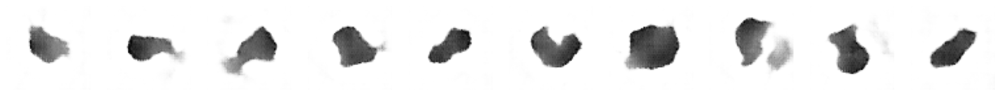

313/313 [==============================] - 335s 1s/step - d_loss: 0.0769 - d_real_acc: 0.8897 - d_fake_acc: 0.8888 - d_acc: 0.8893 - g_loss: 5.3103 - g_acc: 0.1112
Epoch 4/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0860 - d_real_acc: 0.8960 - d_fake_acc: 0.8960 - d_acc: 0.8960 - g_loss: 4.9808 - g_acc: 0.1041
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_003.png


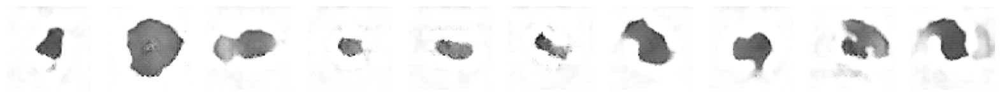

313/313 [==============================] - 328s 1s/step - d_loss: 0.0860 - d_real_acc: 0.8960 - d_fake_acc: 0.8960 - d_acc: 0.8960 - g_loss: 4.9808 - g_acc: 0.1041
Epoch 5/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0265 - d_real_acc: 0.9083 - d_fake_acc: 0.9126 - d_acc: 0.9105 - g_loss: 4.7933 - g_acc: 0.0874
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_004.png


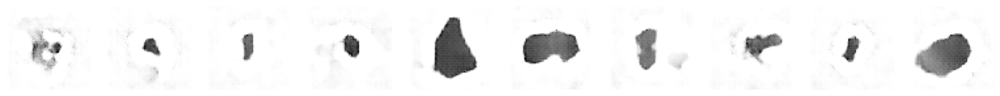

313/313 [==============================] - 327s 1s/step - d_loss: 0.0265 - d_real_acc: 0.9083 - d_fake_acc: 0.9126 - d_acc: 0.9105 - g_loss: 4.7933 - g_acc: 0.0874
Epoch 6/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0528 - d_real_acc: 0.9027 - d_fake_acc: 0.9059 - d_acc: 0.9043 - g_loss: 4.9591 - g_acc: 0.0941
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_005.png


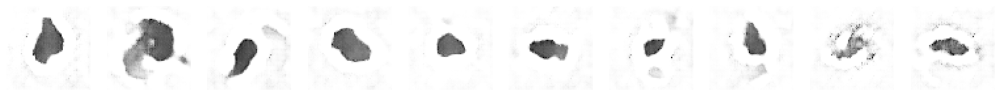

313/313 [==============================] - 328s 1s/step - d_loss: 0.0528 - d_real_acc: 0.9027 - d_fake_acc: 0.9059 - d_acc: 0.9043 - g_loss: 4.9591 - g_acc: 0.0941
Epoch 7/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0613 - d_real_acc: 0.8968 - d_fake_acc: 0.8992 - d_acc: 0.8980 - g_loss: 5.0785 - g_acc: 0.1008
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_006.png


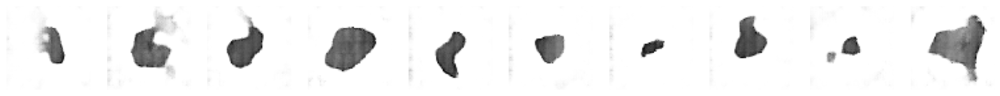

313/313 [==============================] - 327s 1s/step - d_loss: 0.0613 - d_real_acc: 0.8968 - d_fake_acc: 0.8992 - d_acc: 0.8980 - g_loss: 5.0785 - g_acc: 0.1008
Epoch 8/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0382 - d_real_acc: 0.9062 - d_fake_acc: 0.9071 - d_acc: 0.9066 - g_loss: 5.0106 - g_acc: 0.0929
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_007.png


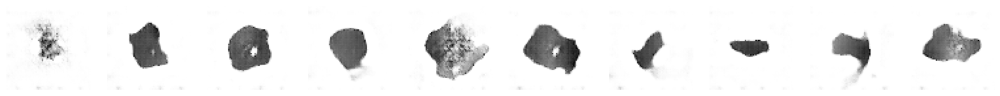

313/313 [==============================] - 331s 1s/step - d_loss: 0.0382 - d_real_acc: 0.9062 - d_fake_acc: 0.9071 - d_acc: 0.9066 - g_loss: 5.0106 - g_acc: 0.0929
Epoch 9/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0074 - d_real_acc: 0.9121 - d_fake_acc: 0.9119 - d_acc: 0.9120 - g_loss: 5.5752 - g_acc: 0.0881
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_008.png


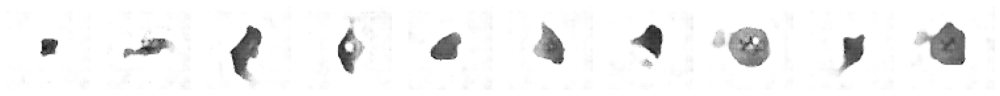

313/313 [==============================] - 328s 1s/step - d_loss: 0.0074 - d_real_acc: 0.9121 - d_fake_acc: 0.9119 - d_acc: 0.9120 - g_loss: 5.5752 - g_acc: 0.0881
Epoch 10/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0164 - d_real_acc: 0.9197 - d_fake_acc: 0.9187 - d_acc: 0.9192 - g_loss: 5.7604 - g_acc: 0.0813
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_009.png


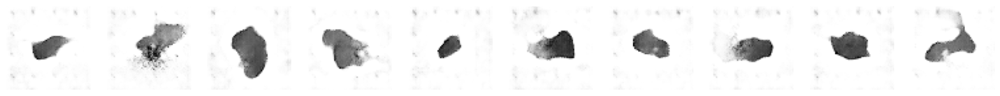

313/313 [==============================] - 327s 1s/step - d_loss: 0.0164 - d_real_acc: 0.9197 - d_fake_acc: 0.9187 - d_acc: 0.9192 - g_loss: 5.7604 - g_acc: 0.0813
Epoch 11/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0432 - d_real_acc: 0.9007 - d_fake_acc: 0.9035 - d_acc: 0.9021 - g_loss: 5.4229 - g_acc: 0.0965
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_010.png


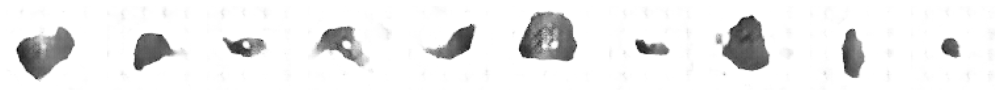

313/313 [==============================] - 326s 1s/step - d_loss: 0.0432 - d_real_acc: 0.9007 - d_fake_acc: 0.9035 - d_acc: 0.9021 - g_loss: 5.4229 - g_acc: 0.0965
Epoch 12/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0665 - d_real_acc: 0.8856 - d_fake_acc: 0.8840 - d_acc: 0.8848 - g_loss: 5.5101 - g_acc: 0.1160
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_011.png


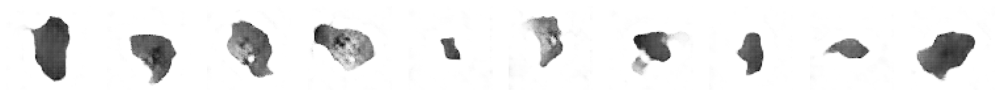

313/313 [==============================] - 330s 1s/step - d_loss: 0.0665 - d_real_acc: 0.8856 - d_fake_acc: 0.8840 - d_acc: 0.8848 - g_loss: 5.5101 - g_acc: 0.1160
Epoch 13/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0669 - d_real_acc: 0.9308 - d_fake_acc: 0.9316 - d_acc: 0.9312 - g_loss: 6.4774 - g_acc: 0.0684
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_012.png


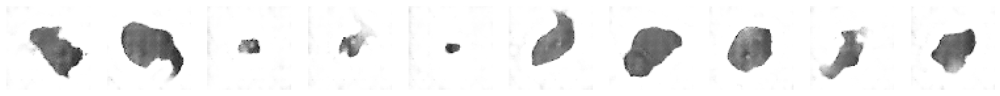

313/313 [==============================] - 331s 1s/step - d_loss: -0.0669 - d_real_acc: 0.9308 - d_fake_acc: 0.9316 - d_acc: 0.9312 - g_loss: 6.4774 - g_acc: 0.0684
Epoch 14/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0188 - d_real_acc: 0.9247 - d_fake_acc: 0.9237 - d_acc: 0.9242 - g_loss: 6.1459 - g_acc: 0.0763
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_013.png


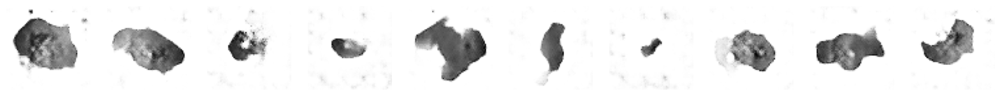

313/313 [==============================] - 330s 1s/step - d_loss: -0.0188 - d_real_acc: 0.9247 - d_fake_acc: 0.9237 - d_acc: 0.9242 - g_loss: 6.1459 - g_acc: 0.0763
Epoch 15/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0498 - d_real_acc: 0.8866 - d_fake_acc: 0.8812 - d_acc: 0.8838 - g_loss: 5.5828 - g_acc: 0.1189
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_014.png


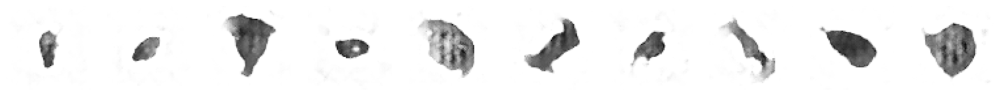

313/313 [==============================] - 331s 1s/step - d_loss: 0.0498 - d_real_acc: 0.8866 - d_fake_acc: 0.8812 - d_acc: 0.8838 - g_loss: 5.5828 - g_acc: 0.1189
Epoch 16/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0113 - d_real_acc: 0.9144 - d_fake_acc: 0.9123 - d_acc: 0.9134 - g_loss: 6.0656 - g_acc: 0.0877
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_015.png


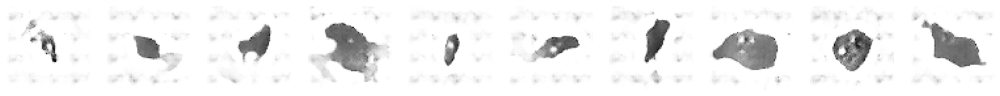

313/313 [==============================] - 330s 1s/step - d_loss: -0.0113 - d_real_acc: 0.9144 - d_fake_acc: 0.9123 - d_acc: 0.9134 - g_loss: 6.0656 - g_acc: 0.0877
Epoch 17/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0563 - d_real_acc: 0.9286 - d_fake_acc: 0.9295 - d_acc: 0.9291 - g_loss: 6.6012 - g_acc: 0.0705
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_016.png


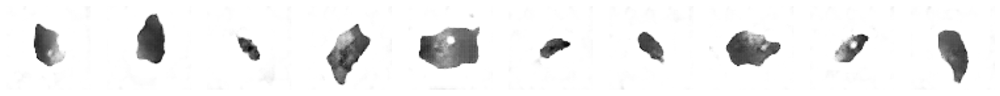

313/313 [==============================] - 330s 1s/step - d_loss: -0.0563 - d_real_acc: 0.9286 - d_fake_acc: 0.9295 - d_acc: 0.9291 - g_loss: 6.6012 - g_acc: 0.0705
Epoch 18/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0350 - d_real_acc: 0.9115 - d_fake_acc: 0.9118 - d_acc: 0.9117 - g_loss: 6.4915 - g_acc: 0.0882
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_017.png


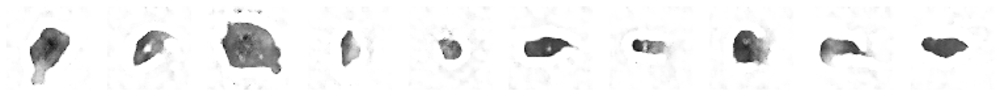

313/313 [==============================] - 331s 1s/step - d_loss: -0.0350 - d_real_acc: 0.9115 - d_fake_acc: 0.9118 - d_acc: 0.9117 - g_loss: 6.4915 - g_acc: 0.0882
Epoch 19/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0846 - d_real_acc: 0.9341 - d_fake_acc: 0.9353 - d_acc: 0.9347 - g_loss: 7.1811 - g_acc: 0.0647
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_018.png


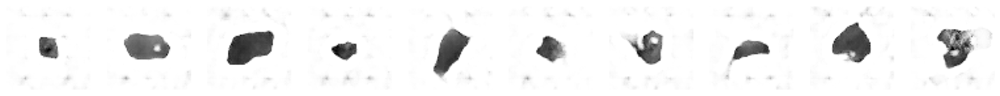

313/313 [==============================] - 335s 1s/step - d_loss: -0.0846 - d_real_acc: 0.9341 - d_fake_acc: 0.9353 - d_acc: 0.9347 - g_loss: 7.1811 - g_acc: 0.0647
Epoch 20/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1263 - d_real_acc: 0.9457 - d_fake_acc: 0.9460 - d_acc: 0.9459 - g_loss: 7.1941 - g_acc: 0.0540
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_019.png


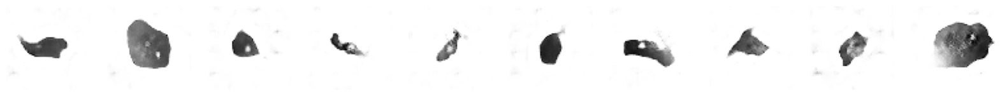

313/313 [==============================] - 330s 1s/step - d_loss: -0.1263 - d_real_acc: 0.9457 - d_fake_acc: 0.9460 - d_acc: 0.9459 - g_loss: 7.1941 - g_acc: 0.0540
Epoch 21/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0191 - d_real_acc: 0.9270 - d_fake_acc: 0.9288 - d_acc: 0.9279 - g_loss: 7.3385 - g_acc: 0.0712
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_020.png


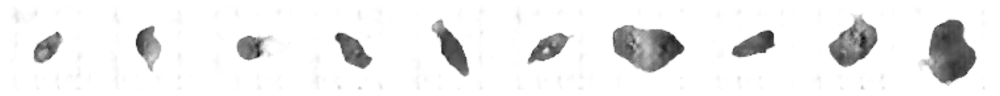

313/313 [==============================] - 329s 1s/step - d_loss: -0.0191 - d_real_acc: 0.9270 - d_fake_acc: 0.9288 - d_acc: 0.9279 - g_loss: 7.3385 - g_acc: 0.0712
Epoch 22/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1358 - d_real_acc: 0.9443 - d_fake_acc: 0.9450 - d_acc: 0.9446 - g_loss: 7.1005 - g_acc: 0.0550
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_021.png


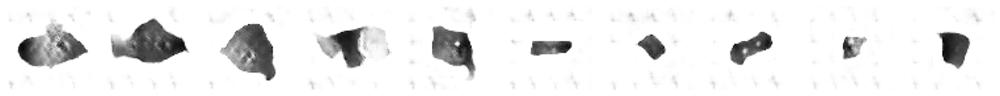

313/313 [==============================] - 328s 1s/step - d_loss: -0.1358 - d_real_acc: 0.9443 - d_fake_acc: 0.9450 - d_acc: 0.9446 - g_loss: 7.1005 - g_acc: 0.0550
Epoch 23/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0969 - d_real_acc: 0.9316 - d_fake_acc: 0.9364 - d_acc: 0.9340 - g_loss: 8.1058 - g_acc: 0.0636
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_022.png


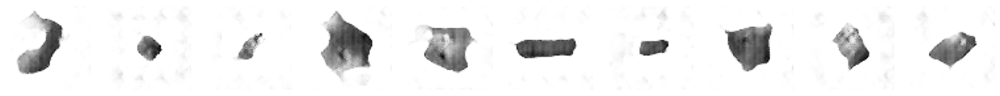

313/313 [==============================] - 328s 1s/step - d_loss: -0.0969 - d_real_acc: 0.9316 - d_fake_acc: 0.9364 - d_acc: 0.9340 - g_loss: 8.1058 - g_acc: 0.0636
Epoch 24/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0922 - d_real_acc: 0.9341 - d_fake_acc: 0.9357 - d_acc: 0.9349 - g_loss: 7.0329 - g_acc: 0.0643
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_023.png


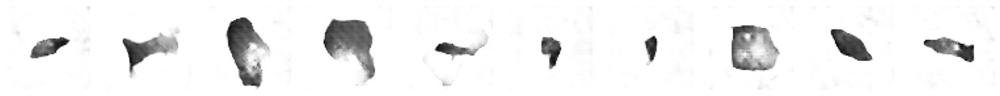

313/313 [==============================] - 327s 1s/step - d_loss: -0.0922 - d_real_acc: 0.9341 - d_fake_acc: 0.9357 - d_acc: 0.9349 - g_loss: 7.0329 - g_acc: 0.0643
Epoch 25/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1956 - d_real_acc: 0.9470 - d_fake_acc: 0.9474 - d_acc: 0.9472 - g_loss: 7.6754 - g_acc: 0.0526
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_024.png


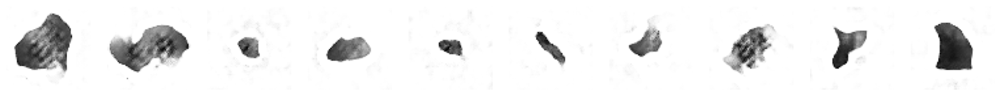

313/313 [==============================] - 327s 1s/step - d_loss: -0.1956 - d_real_acc: 0.9470 - d_fake_acc: 0.9474 - d_acc: 0.9472 - g_loss: 7.6754 - g_acc: 0.0526
Epoch 26/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1465 - d_real_acc: 0.9394 - d_fake_acc: 0.9395 - d_acc: 0.9395 - g_loss: 7.8483 - g_acc: 0.0604
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_025.png


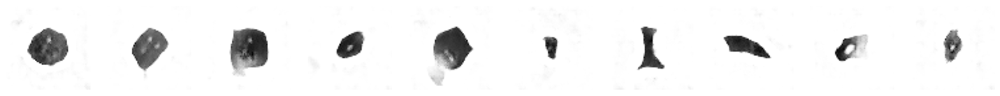

313/313 [==============================] - 328s 1s/step - d_loss: -0.1465 - d_real_acc: 0.9394 - d_fake_acc: 0.9395 - d_acc: 0.9395 - g_loss: 7.8483 - g_acc: 0.0604
Epoch 27/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1476 - d_real_acc: 0.9327 - d_fake_acc: 0.9311 - d_acc: 0.9319 - g_loss: 8.1409 - g_acc: 0.0689
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_026.png


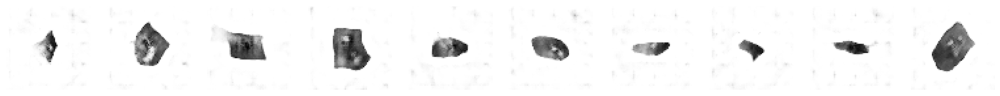

313/313 [==============================] - 329s 1s/step - d_loss: -0.1476 - d_real_acc: 0.9327 - d_fake_acc: 0.9311 - d_acc: 0.9319 - g_loss: 8.1409 - g_acc: 0.0689
Epoch 28/300
313/313 [==============================] - ETA: 0s - d_loss: 2.8371 - d_real_acc: 0.5807 - d_fake_acc: 0.9500 - d_acc: 0.7654 - g_loss: 10.2288 - g_acc: 0.0500
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_027.png


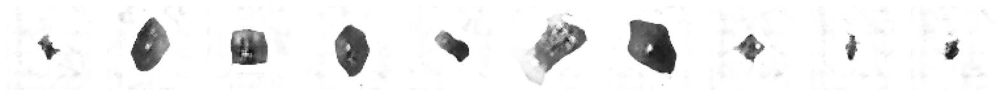

313/313 [==============================] - 327s 1s/step - d_loss: 2.8371 - d_real_acc: 0.5807 - d_fake_acc: 0.9500 - d_acc: 0.7654 - g_loss: 10.2288 - g_acc: 0.0500
Epoch 29/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0346 - d_real_acc: 0.9223 - d_fake_acc: 0.9247 - d_acc: 0.9235 - g_loss: 7.6206 - g_acc: 0.0753
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_028.png


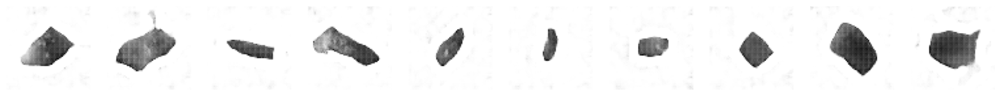

313/313 [==============================] - 329s 1s/step - d_loss: -0.0346 - d_real_acc: 0.9223 - d_fake_acc: 0.9247 - d_acc: 0.9235 - g_loss: 7.6206 - g_acc: 0.0753
Epoch 30/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0540 - d_real_acc: 0.9194 - d_fake_acc: 0.9238 - d_acc: 0.9216 - g_loss: 7.1695 - g_acc: 0.0762
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_029.png


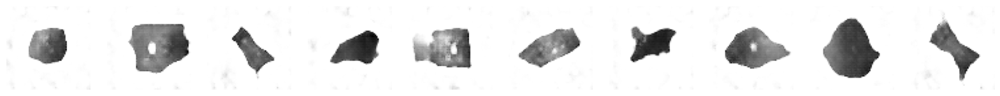

313/313 [==============================] - 331s 1s/step - d_loss: -0.0540 - d_real_acc: 0.9194 - d_fake_acc: 0.9238 - d_acc: 0.9216 - g_loss: 7.1695 - g_acc: 0.0762
Epoch 31/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2001 - d_real_acc: 0.9452 - d_fake_acc: 0.9456 - d_acc: 0.9454 - g_loss: 8.8642 - g_acc: 0.0544
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_030.png


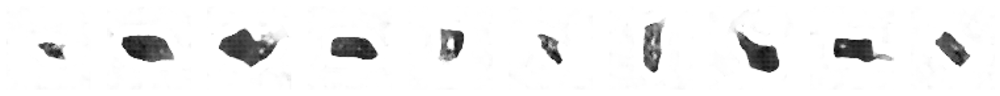

313/313 [==============================] - 329s 1s/step - d_loss: -0.2001 - d_real_acc: 0.9452 - d_fake_acc: 0.9456 - d_acc: 0.9454 - g_loss: 8.8642 - g_acc: 0.0544
Epoch 32/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1079 - d_real_acc: 0.9432 - d_fake_acc: 0.9453 - d_acc: 0.9443 - g_loss: 8.4022 - g_acc: 0.0547
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_031.png


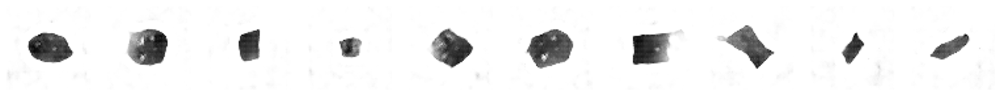

313/313 [==============================] - 328s 1s/step - d_loss: -0.1079 - d_real_acc: 0.9432 - d_fake_acc: 0.9453 - d_acc: 0.9443 - g_loss: 8.4022 - g_acc: 0.0547
Epoch 33/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0551 - d_real_acc: 0.9153 - d_fake_acc: 0.9194 - d_acc: 0.9174 - g_loss: 8.0282 - g_acc: 0.0806
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_032.png


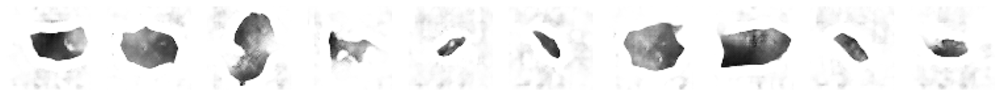

313/313 [==============================] - 328s 1s/step - d_loss: -0.0551 - d_real_acc: 0.9153 - d_fake_acc: 0.9194 - d_acc: 0.9174 - g_loss: 8.0282 - g_acc: 0.0806
Epoch 34/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1606 - d_real_acc: 0.9424 - d_fake_acc: 0.9424 - d_acc: 0.9424 - g_loss: 7.9133 - g_acc: 0.0576
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_033.png


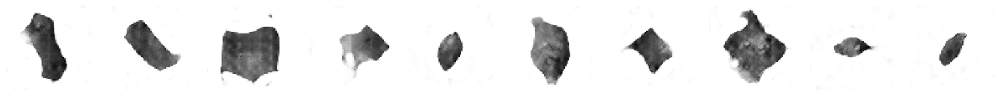

313/313 [==============================] - 328s 1s/step - d_loss: -0.1606 - d_real_acc: 0.9424 - d_fake_acc: 0.9424 - d_acc: 0.9424 - g_loss: 7.9133 - g_acc: 0.0576
Epoch 35/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2169 - d_real_acc: 0.9447 - d_fake_acc: 0.9467 - d_acc: 0.9457 - g_loss: 8.6879 - g_acc: 0.0532
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_034.png


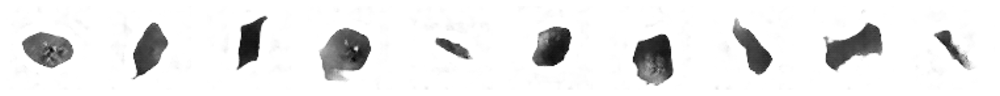

313/313 [==============================] - 328s 1s/step - d_loss: -0.2169 - d_real_acc: 0.9447 - d_fake_acc: 0.9467 - d_acc: 0.9457 - g_loss: 8.6879 - g_acc: 0.0532
Epoch 36/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0945 - d_real_acc: 0.9298 - d_fake_acc: 0.9387 - d_acc: 0.9343 - g_loss: 8.8294 - g_acc: 0.0613
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_035.png


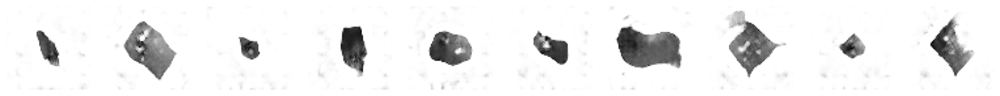

313/313 [==============================] - 330s 1s/step - d_loss: -0.0945 - d_real_acc: 0.9298 - d_fake_acc: 0.9387 - d_acc: 0.9343 - g_loss: 8.8294 - g_acc: 0.0613
Epoch 37/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1762 - d_real_acc: 0.9413 - d_fake_acc: 0.9431 - d_acc: 0.9422 - g_loss: 8.1521 - g_acc: 0.0569
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_036.png


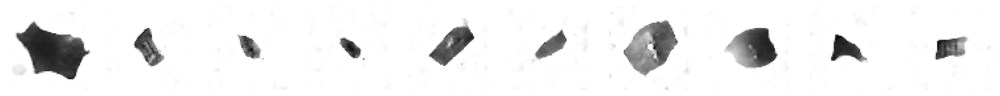

313/313 [==============================] - 328s 1s/step - d_loss: -0.1762 - d_real_acc: 0.9413 - d_fake_acc: 0.9431 - d_acc: 0.9422 - g_loss: 8.1521 - g_acc: 0.0569
Epoch 38/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2197 - d_real_acc: 0.9485 - d_fake_acc: 0.9525 - d_acc: 0.9505 - g_loss: 8.7437 - g_acc: 0.0474
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_037.png


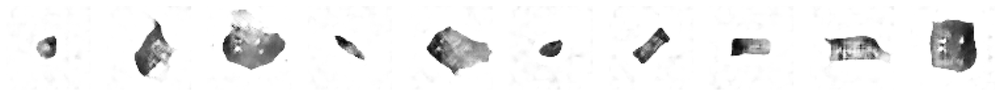

313/313 [==============================] - 328s 1s/step - d_loss: -0.2197 - d_real_acc: 0.9485 - d_fake_acc: 0.9525 - d_acc: 0.9505 - g_loss: 8.7437 - g_acc: 0.0474
Epoch 39/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1741 - d_real_acc: 0.9402 - d_fake_acc: 0.9498 - d_acc: 0.9450 - g_loss: 9.1545 - g_acc: 0.0502
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_038.png


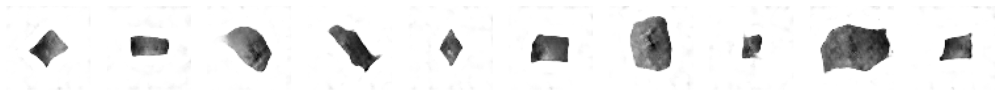

313/313 [==============================] - 329s 1s/step - d_loss: -0.1741 - d_real_acc: 0.9402 - d_fake_acc: 0.9498 - d_acc: 0.9450 - g_loss: 9.1545 - g_acc: 0.0502
Epoch 40/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2804 - d_real_acc: 0.9566 - d_fake_acc: 0.9577 - d_acc: 0.9571 - g_loss: 9.2443 - g_acc: 0.0423
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_039.png


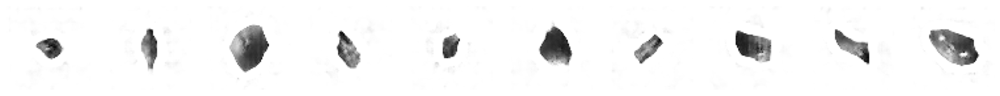

313/313 [==============================] - 330s 1s/step - d_loss: -0.2804 - d_real_acc: 0.9566 - d_fake_acc: 0.9577 - d_acc: 0.9571 - g_loss: 9.2443 - g_acc: 0.0423
Epoch 41/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1463 - d_real_acc: 0.9358 - d_fake_acc: 0.9357 - d_acc: 0.9357 - g_loss: 8.5945 - g_acc: 0.0643
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_040.png


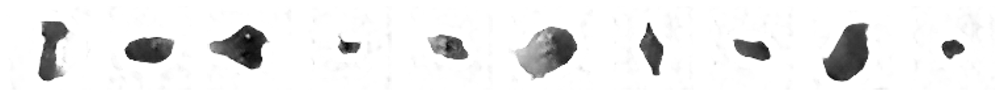

313/313 [==============================] - 332s 1s/step - d_loss: -0.1463 - d_real_acc: 0.9358 - d_fake_acc: 0.9357 - d_acc: 0.9357 - g_loss: 8.5945 - g_acc: 0.0643
Epoch 42/300
313/313 [==============================] - ETA: 0s - d_loss: 0.7250 - d_real_acc: 0.8058 - d_fake_acc: 0.8845 - d_acc: 0.8451 - g_loss: 8.3070 - g_acc: 0.1155
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_041.png


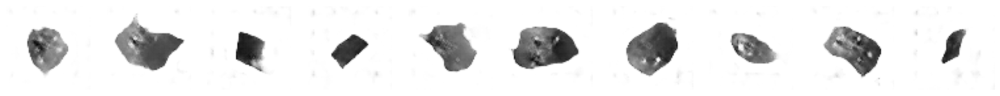

313/313 [==============================] - 330s 1s/step - d_loss: 0.7250 - d_real_acc: 0.8058 - d_fake_acc: 0.8845 - d_acc: 0.8451 - g_loss: 8.3070 - g_acc: 0.1155
Epoch 43/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2494 - d_real_acc: 0.9516 - d_fake_acc: 0.9542 - d_acc: 0.9529 - g_loss: 9.0639 - g_acc: 0.0458
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_042.png


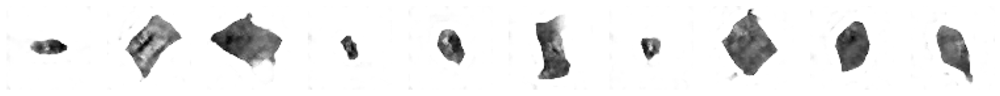

313/313 [==============================] - 329s 1s/step - d_loss: -0.2494 - d_real_acc: 0.9516 - d_fake_acc: 0.9542 - d_acc: 0.9529 - g_loss: 9.0639 - g_acc: 0.0458
Epoch 44/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3379 - d_real_acc: 0.9611 - d_fake_acc: 0.9612 - d_acc: 0.9612 - g_loss: 9.7449 - g_acc: 0.0388
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_043.png


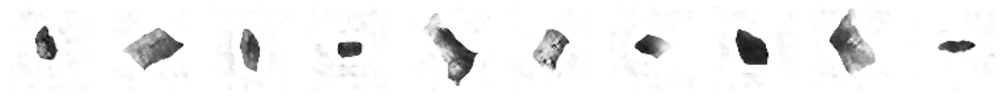

313/313 [==============================] - 330s 1s/step - d_loss: -0.3379 - d_real_acc: 0.9611 - d_fake_acc: 0.9612 - d_acc: 0.9612 - g_loss: 9.7449 - g_acc: 0.0388
Epoch 45/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3470 - d_real_acc: 0.9602 - d_fake_acc: 0.9628 - d_acc: 0.9615 - g_loss: 10.3050 - g_acc: 0.0372
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_044.png


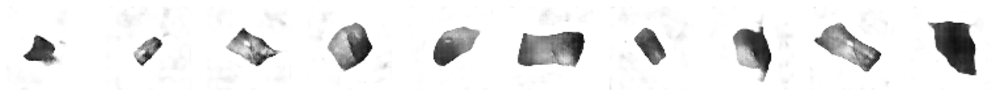

313/313 [==============================] - 330s 1s/step - d_loss: -0.3470 - d_real_acc: 0.9602 - d_fake_acc: 0.9628 - d_acc: 0.9615 - g_loss: 10.3050 - g_acc: 0.0372
Epoch 46/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4840 - d_real_acc: 0.9766 - d_fake_acc: 0.9779 - d_acc: 0.9773 - g_loss: 11.3669 - g_acc: 0.0221
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_045.png


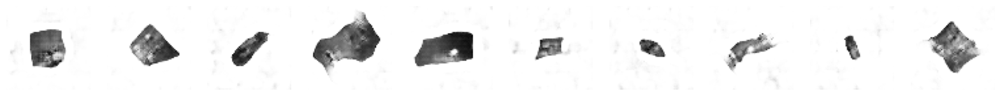

313/313 [==============================] - 330s 1s/step - d_loss: -0.4840 - d_real_acc: 0.9766 - d_fake_acc: 0.9779 - d_acc: 0.9773 - g_loss: 11.3669 - g_acc: 0.0221
Epoch 47/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2737 - d_real_acc: 0.9516 - d_fake_acc: 0.9516 - d_acc: 0.9516 - g_loss: 9.4120 - g_acc: 0.0484
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_046.png


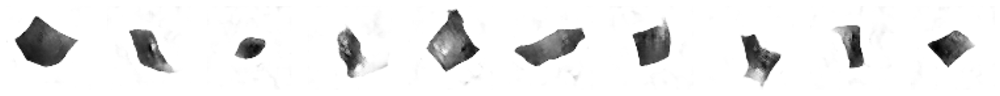

313/313 [==============================] - 330s 1s/step - d_loss: -0.2737 - d_real_acc: 0.9516 - d_fake_acc: 0.9516 - d_acc: 0.9516 - g_loss: 9.4120 - g_acc: 0.0484
Epoch 48/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3678 - d_real_acc: 0.9646 - d_fake_acc: 0.9657 - d_acc: 0.9651 - g_loss: 10.3201 - g_acc: 0.0343
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_047.png


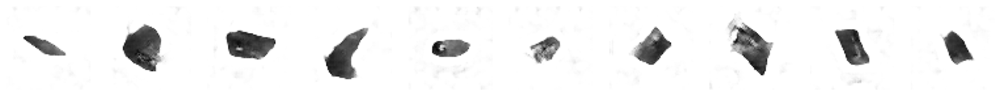

313/313 [==============================] - 330s 1s/step - d_loss: -0.3678 - d_real_acc: 0.9646 - d_fake_acc: 0.9657 - d_acc: 0.9651 - g_loss: 10.3201 - g_acc: 0.0343
Epoch 49/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4320 - d_real_acc: 0.9725 - d_fake_acc: 0.9743 - d_acc: 0.9734 - g_loss: 10.8264 - g_acc: 0.0257
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_048.png


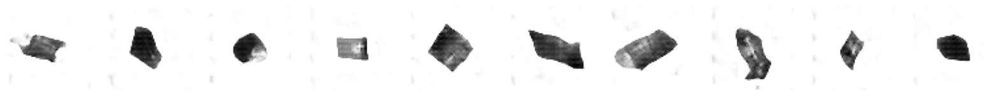

313/313 [==============================] - 330s 1s/step - d_loss: -0.4320 - d_real_acc: 0.9725 - d_fake_acc: 0.9743 - d_acc: 0.9734 - g_loss: 10.8264 - g_acc: 0.0257
Epoch 50/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4699 - d_real_acc: 0.9700 - d_fake_acc: 0.9705 - d_acc: 0.9703 - g_loss: 12.7412 - g_acc: 0.0295
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_049.png


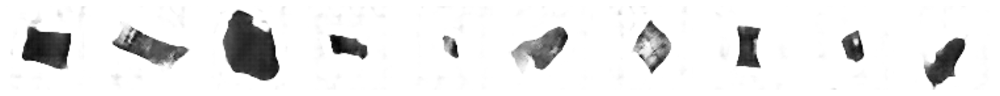

313/313 [==============================] - 329s 1s/step - d_loss: -0.4699 - d_real_acc: 0.9700 - d_fake_acc: 0.9705 - d_acc: 0.9703 - g_loss: 12.7412 - g_acc: 0.0295
Epoch 51/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3049 - d_real_acc: 0.9533 - d_fake_acc: 0.9540 - d_acc: 0.9536 - g_loss: 9.7562 - g_acc: 0.0460
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_050.png


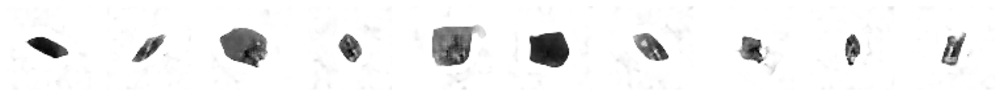

313/313 [==============================] - 332s 1s/step - d_loss: -0.3049 - d_real_acc: 0.9533 - d_fake_acc: 0.9540 - d_acc: 0.9536 - g_loss: 9.7562 - g_acc: 0.0460
Epoch 52/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2851 - d_real_acc: 0.9522 - d_fake_acc: 0.9562 - d_acc: 0.9542 - g_loss: 10.5365 - g_acc: 0.0438
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_051.png


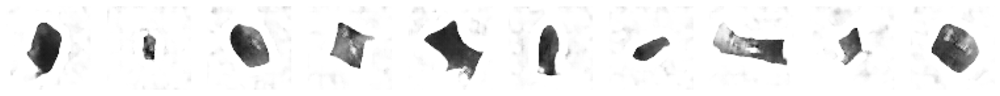

313/313 [==============================] - 333s 1s/step - d_loss: -0.2851 - d_real_acc: 0.9522 - d_fake_acc: 0.9562 - d_acc: 0.9542 - g_loss: 10.5365 - g_acc: 0.0438
Epoch 53/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2793 - d_real_acc: 0.9581 - d_fake_acc: 0.9530 - d_acc: 0.9555 - g_loss: 10.9735 - g_acc: 0.0470
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_052.png


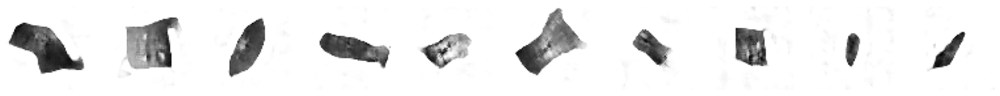

313/313 [==============================] - 330s 1s/step - d_loss: -0.2793 - d_real_acc: 0.9581 - d_fake_acc: 0.9530 - d_acc: 0.9555 - g_loss: 10.9735 - g_acc: 0.0470
Epoch 54/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2542 - d_real_acc: 0.9446 - d_fake_acc: 0.9507 - d_acc: 0.9477 - g_loss: 10.1055 - g_acc: 0.0493
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_053.png


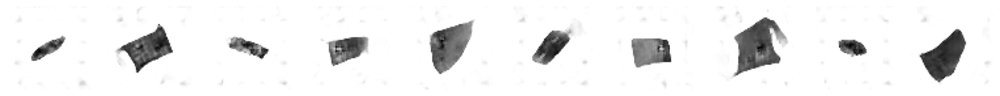

313/313 [==============================] - 330s 1s/step - d_loss: -0.2542 - d_real_acc: 0.9446 - d_fake_acc: 0.9507 - d_acc: 0.9477 - g_loss: 10.1055 - g_acc: 0.0493
Epoch 55/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4893 - d_real_acc: 0.9780 - d_fake_acc: 0.9779 - d_acc: 0.9780 - g_loss: 11.5559 - g_acc: 0.0221
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_054.png


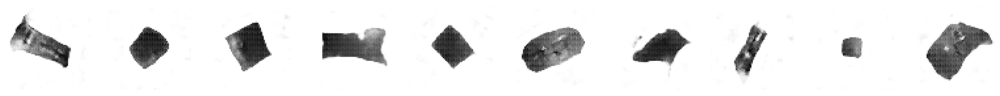

313/313 [==============================] - 330s 1s/step - d_loss: -0.4893 - d_real_acc: 0.9780 - d_fake_acc: 0.9779 - d_acc: 0.9780 - g_loss: 11.5559 - g_acc: 0.0221
Epoch 56/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2554 - d_real_acc: 0.9516 - d_fake_acc: 0.9542 - d_acc: 0.9529 - g_loss: 9.8200 - g_acc: 0.0458
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_055.png


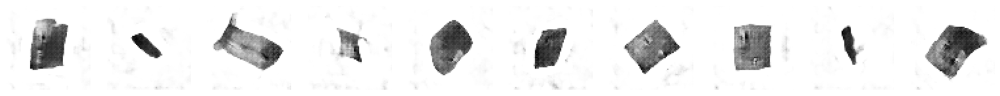

313/313 [==============================] - 330s 1s/step - d_loss: -0.2554 - d_real_acc: 0.9516 - d_fake_acc: 0.9542 - d_acc: 0.9529 - g_loss: 9.8200 - g_acc: 0.0458
Epoch 57/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6182 - d_real_acc: 0.9858 - d_fake_acc: 0.9868 - d_acc: 0.9863 - g_loss: 13.4811 - g_acc: 0.0132
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_056.png


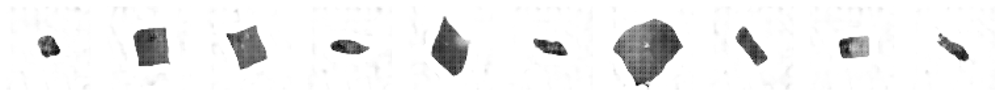

313/313 [==============================] - 330s 1s/step - d_loss: -0.6182 - d_real_acc: 0.9858 - d_fake_acc: 0.9868 - d_acc: 0.9863 - g_loss: 13.4811 - g_acc: 0.0132
Epoch 58/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4700 - d_real_acc: 0.9696 - d_fake_acc: 0.9729 - d_acc: 0.9713 - g_loss: 12.1441 - g_acc: 0.0271
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_057.png


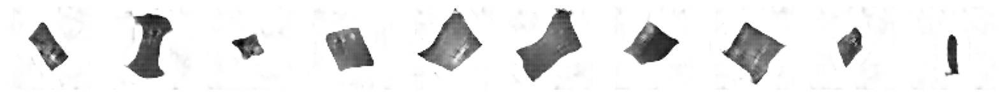

313/313 [==============================] - 330s 1s/step - d_loss: -0.4700 - d_real_acc: 0.9696 - d_fake_acc: 0.9729 - d_acc: 0.9713 - g_loss: 12.1441 - g_acc: 0.0271
Epoch 59/300
313/313 [==============================] - ETA: 0s - d_loss: -0.5414 - d_real_acc: 0.9732 - d_fake_acc: 0.9779 - d_acc: 0.9756 - g_loss: 13.9573 - g_acc: 0.0221
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_058.png


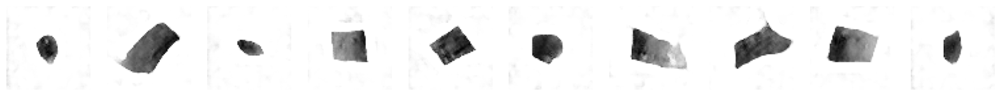

313/313 [==============================] - 330s 1s/step - d_loss: -0.5414 - d_real_acc: 0.9732 - d_fake_acc: 0.9779 - d_acc: 0.9756 - g_loss: 13.9573 - g_acc: 0.0221
Epoch 60/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3771 - d_real_acc: 0.9596 - d_fake_acc: 0.9621 - d_acc: 0.9609 - g_loss: 11.0106 - g_acc: 0.0379
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_059.png


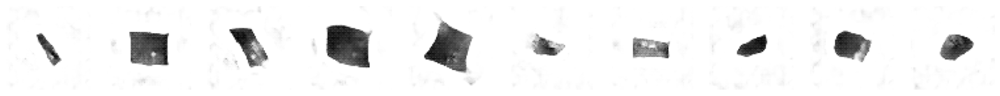

313/313 [==============================] - 331s 1s/step - d_loss: -0.3771 - d_real_acc: 0.9596 - d_fake_acc: 0.9621 - d_acc: 0.9609 - g_loss: 11.0106 - g_acc: 0.0379
Epoch 61/300
313/313 [==============================] - ETA: 0s - d_loss: 3.4341 - d_real_acc: 0.5087 - d_fake_acc: 0.9901 - d_acc: 0.7494 - g_loss: 15.0793 - g_acc: 0.0099
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_060.png


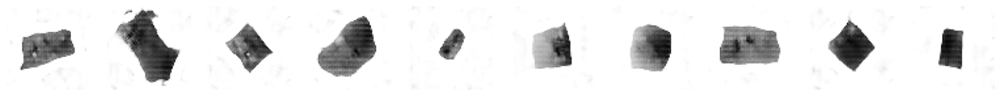

313/313 [==============================] - 330s 1s/step - d_loss: 3.4341 - d_real_acc: 0.5087 - d_fake_acc: 0.9901 - d_acc: 0.7494 - g_loss: 15.0793 - g_acc: 0.0099
Epoch 62/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7067 - d_real_acc: 3.0000e-04 - d_fake_acc: 0.9999 - d_acc: 0.5001 - g_loss: 15.4215 - g_acc: 5.0000e-05
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_061.png


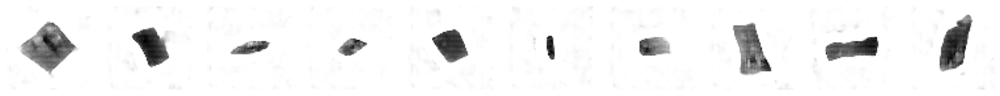

313/313 [==============================] - 332s 1s/step - d_loss: 7.7067 - d_real_acc: 3.0000e-04 - d_fake_acc: 0.9999 - d_acc: 0.5001 - g_loss: 15.4215 - g_acc: 5.0000e-05
Epoch 63/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2414 - d_real_acc: 0.8841 - d_fake_acc: 0.9299 - d_acc: 0.9070 - g_loss: 10.3349 - g_acc: 0.0701
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_062.png


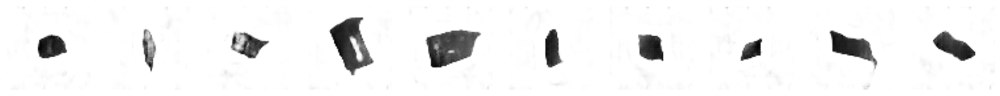

313/313 [==============================] - 333s 1s/step - d_loss: 0.2414 - d_real_acc: 0.8841 - d_fake_acc: 0.9299 - d_acc: 0.9070 - g_loss: 10.3349 - g_acc: 0.0701
Epoch 64/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4874 - d_real_acc: 0.9691 - d_fake_acc: 0.9732 - d_acc: 0.9711 - g_loss: 12.6603 - g_acc: 0.0269
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_063.png


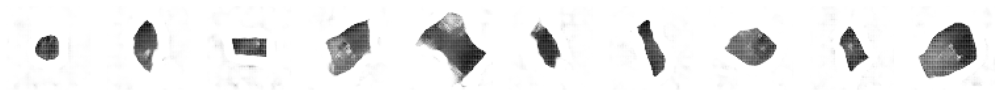

313/313 [==============================] - 331s 1s/step - d_loss: -0.4874 - d_real_acc: 0.9691 - d_fake_acc: 0.9732 - d_acc: 0.9711 - g_loss: 12.6603 - g_acc: 0.0269
Epoch 65/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7645 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_064.png


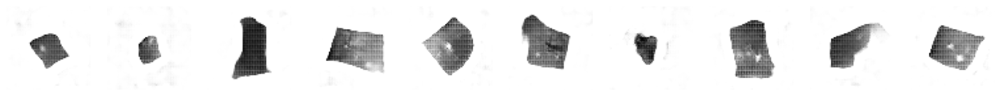

313/313 [==============================] - 330s 1s/step - d_loss: -0.7645 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 66/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7688 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_065.png


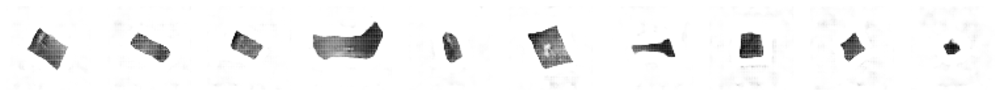

313/313 [==============================] - 330s 1s/step - d_loss: -0.7688 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 67/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7643 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_066.png


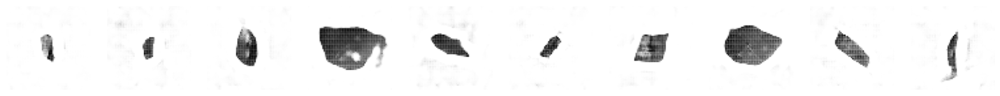

313/313 [==============================] - 330s 1s/step - d_loss: -0.7643 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 68/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_067.png


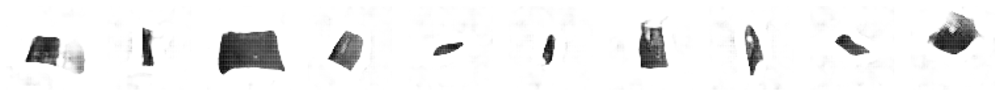

313/313 [==============================] - 330s 1s/step - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Epoch 69/300
313/313 [==============================] - ETA: 0s - d_loss: 0.5220 - d_real_acc: 0.8465 - d_fake_acc: 0.8867 - d_acc: 0.8666 - g_loss: 10.1069 - g_acc: 0.1133
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_068.png


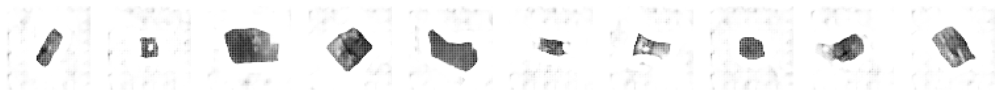

313/313 [==============================] - 331s 1s/step - d_loss: 0.5220 - d_real_acc: 0.8465 - d_fake_acc: 0.8867 - d_acc: 0.8666 - g_loss: 10.1069 - g_acc: 0.1133
Epoch 70/300
313/313 [==============================] - ETA: 0s - d_loss: -0.5517 - d_real_acc: 0.9767 - d_fake_acc: 0.9797 - d_acc: 0.9782 - g_loss: 13.4019 - g_acc: 0.0203
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_069.png


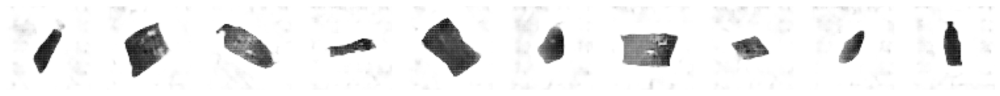

313/313 [==============================] - 331s 1s/step - d_loss: -0.5517 - d_real_acc: 0.9767 - d_fake_acc: 0.9797 - d_acc: 0.9782 - g_loss: 13.4019 - g_acc: 0.0203
Epoch 71/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7614 - d_real_acc: 0.9999 - d_fake_acc: 0.9998 - d_acc: 0.9999 - g_loss: 15.3251 - g_acc: 2.0000e-04
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_070.png


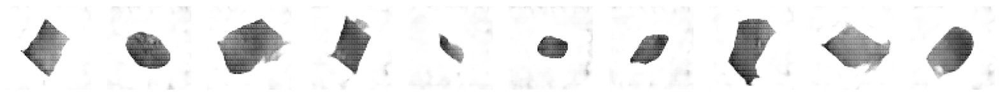

313/313 [==============================] - 331s 1s/step - d_loss: -0.7614 - d_real_acc: 0.9999 - d_fake_acc: 0.9998 - d_acc: 0.9999 - g_loss: 15.3251 - g_acc: 2.0000e-04
Epoch 72/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_071.png


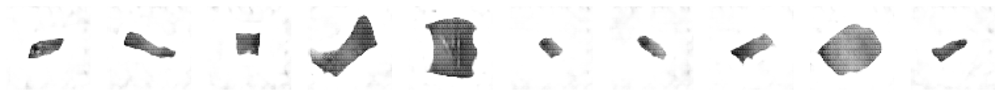

313/313 [==============================] - 331s 1s/step - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 73/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4238 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_072.png


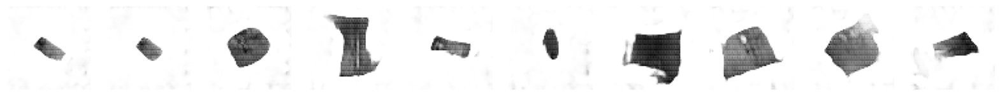

313/313 [==============================] - 334s 1s/step - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4238 - g_acc: 0.0000e+00
Epoch 74/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4111 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_073.png


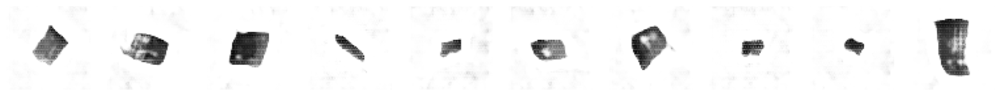

313/313 [==============================] - 332s 1s/step - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4111 - g_acc: 0.0000e+00
Epoch 75/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7651 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4228 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_074.png


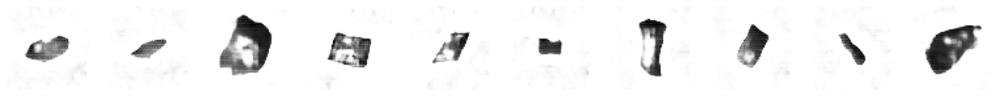

313/313 [==============================] - 332s 1s/step - d_loss: -0.7651 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4228 - g_acc: 0.0000e+00
Epoch 76/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7674 - d_real_acc: 1.0000 - d_fake_acc: 0.9999 - d_acc: 0.9999 - g_loss: 15.4005 - g_acc: 1.0000e-04
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_075.png


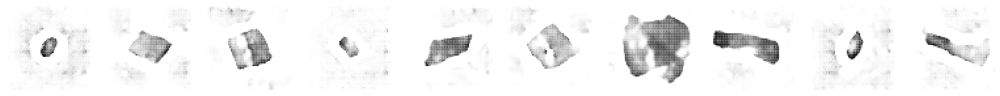

313/313 [==============================] - 331s 1s/step - d_loss: -0.7674 - d_real_acc: 1.0000 - d_fake_acc: 0.9999 - d_acc: 0.9999 - g_loss: 15.4005 - g_acc: 1.0000e-04
Epoch 77/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7673 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_076.png


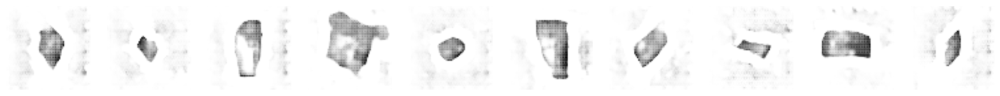

313/313 [==============================] - 332s 1s/step - d_loss: -0.7673 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 78/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7649 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_077.png


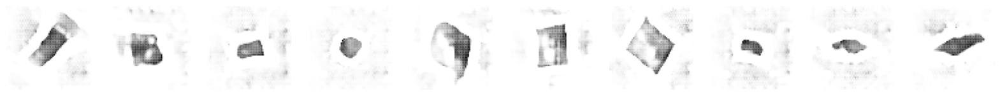

313/313 [==============================] - 332s 1s/step - d_loss: -0.7649 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 79/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7640 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_078.png


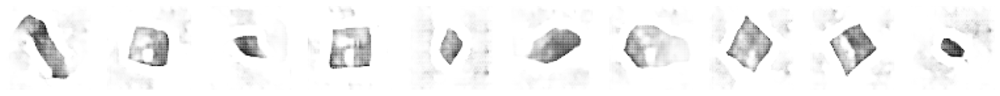

313/313 [==============================] - 332s 1s/step - d_loss: -0.7640 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 80/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_079.png


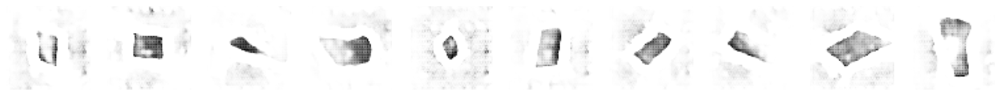

313/313 [==============================] - 332s 1s/step - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 81/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_080.png


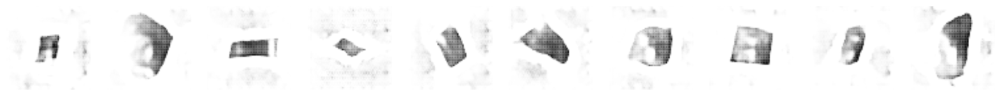

313/313 [==============================] - 332s 1s/step - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 82/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7712 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_081.png


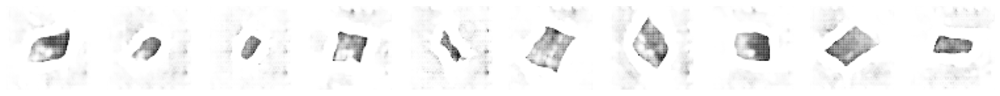

313/313 [==============================] - 332s 1s/step - d_loss: -0.7712 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 83/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_082.png


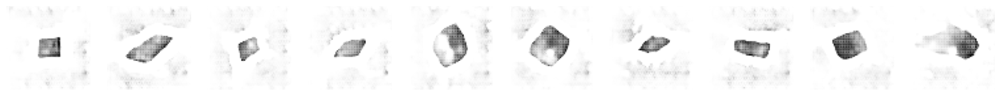

313/313 [==============================] - 332s 1s/step - d_loss: -0.7661 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 84/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7652 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_083.png


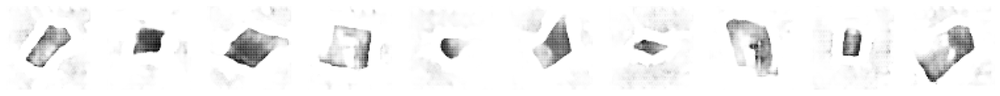

313/313 [==============================] - 334s 1s/step - d_loss: -0.7652 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 85/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7701 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_084.png


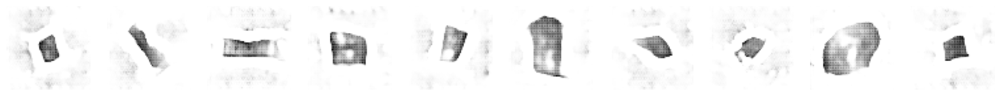

313/313 [==============================] - 334s 1s/step - d_loss: -0.7701 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 86/300
313/313 [==============================] - ETA: 0s - d_loss: 2.7966 - d_real_acc: 0.5824 - d_fake_acc: 0.9969 - d_acc: 0.7896 - g_loss: 15.3754 - g_acc: 0.0032
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_085.png


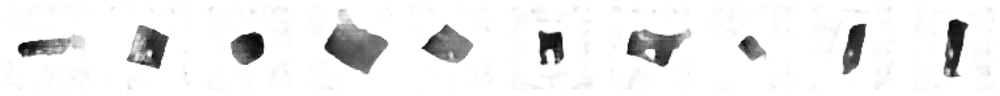

313/313 [==============================] - 333s 1s/step - d_loss: 2.7966 - d_real_acc: 0.5824 - d_fake_acc: 0.9969 - d_acc: 0.7896 - g_loss: 15.3754 - g_acc: 0.0032
Epoch 87/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_086.png


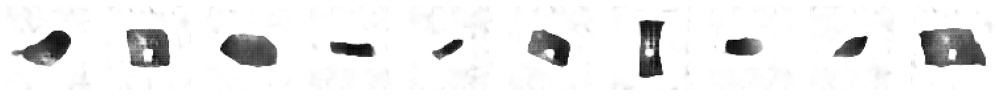

313/313 [==============================] - 333s 1s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 88/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_087.png


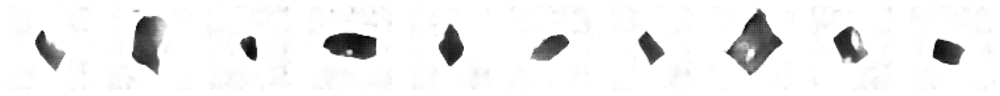

313/313 [==============================] - 333s 1s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 89/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_088.png


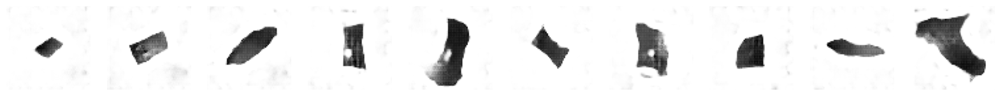

313/313 [==============================] - 333s 1s/step - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 90/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7141 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_089.png


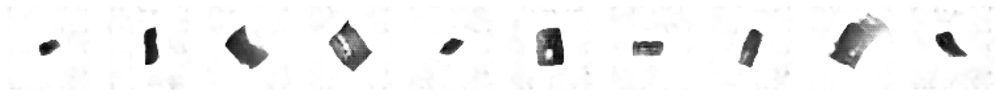

313/313 [==============================] - 333s 1s/step - d_loss: 7.7141 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 91/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_090.png


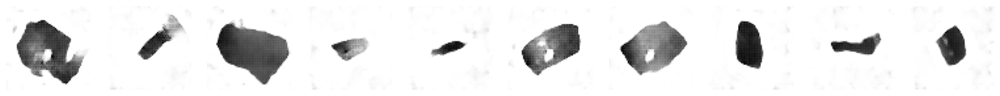

313/313 [==============================] - 333s 1s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 92/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7104 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_091.png


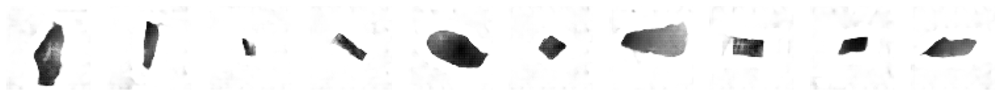

313/313 [==============================] - 333s 1s/step - d_loss: 7.7104 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 93/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_092.png


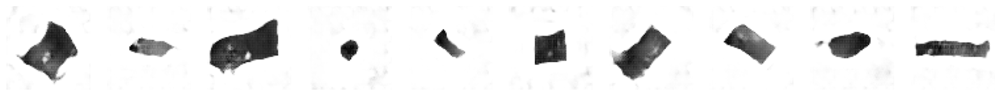

313/313 [==============================] - 334s 1s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 94/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_093.png


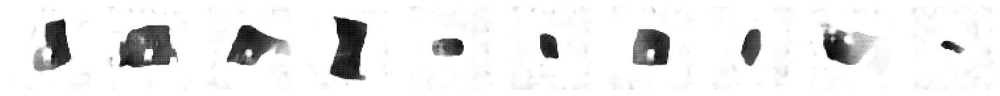

313/313 [==============================] - 333s 1s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 95/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_094.png


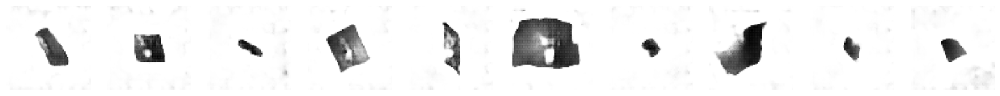

313/313 [==============================] - 337s 1s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 96/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_095.png


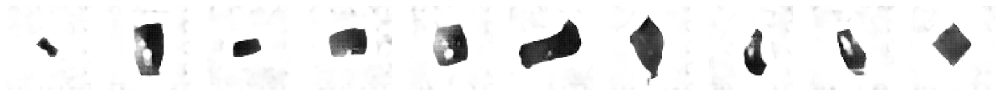

313/313 [==============================] - 334s 1s/step - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 97/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_096.png


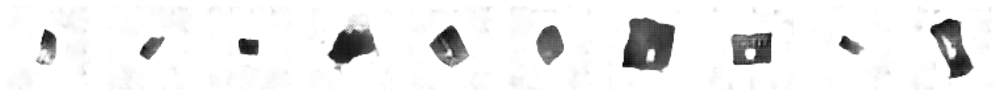

313/313 [==============================] - 333s 1s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 98/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_097.png


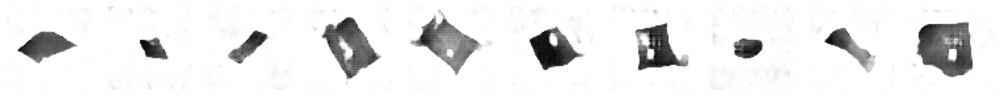

313/313 [==============================] - 334s 1s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 99/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_098.png


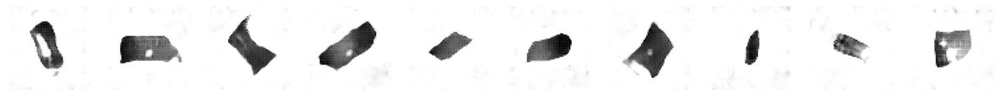

313/313 [==============================] - 339s 1s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 100/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_099.png


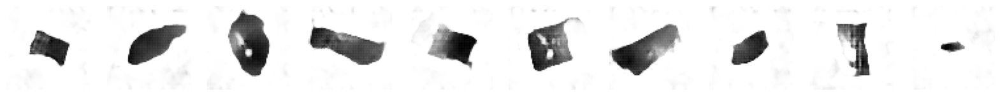

313/313 [==============================] - 333s 1s/step - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 101/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7158 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_100.png


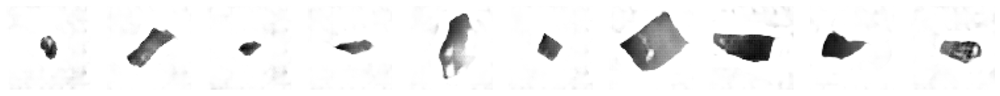

313/313 [==============================] - 332s 1s/step - d_loss: 7.7158 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 102/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_101.png


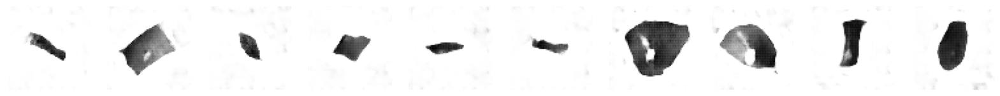

313/313 [==============================] - 332s 1s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 103/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_102.png


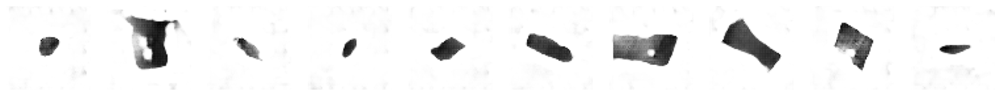

313/313 [==============================] - 332s 1s/step - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 104/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7141 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_103.png


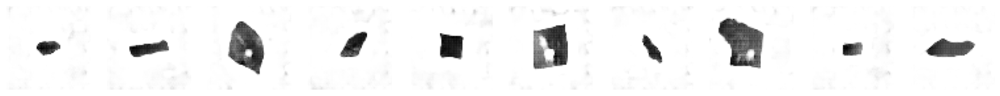

313/313 [==============================] - 332s 1s/step - d_loss: 7.7141 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 105/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_104.png


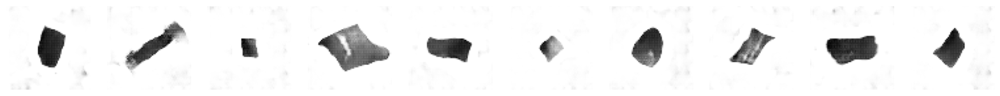

313/313 [==============================] - 332s 1s/step - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 106/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_105.png


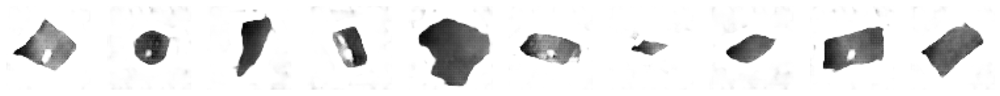

313/313 [==============================] - 335s 1s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 107/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_106.png


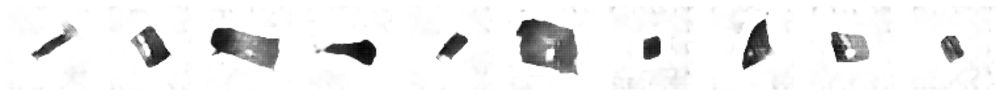

313/313 [==============================] - 332s 1s/step - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 108/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_107.png


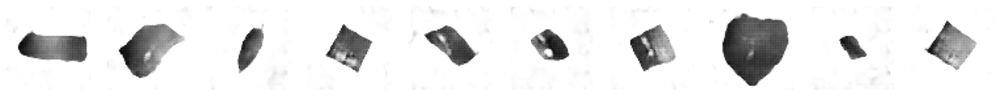

313/313 [==============================] - 332s 1s/step - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 109/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_108.png


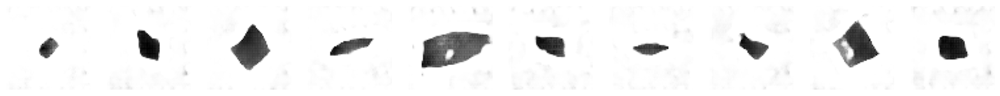

313/313 [==============================] - 332s 1s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 110/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_109.png


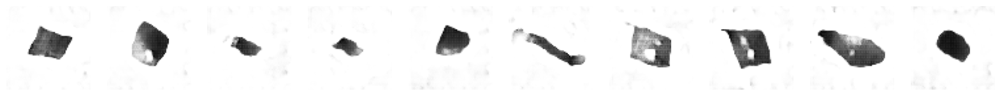

313/313 [==============================] - 332s 1s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 111/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_110.png


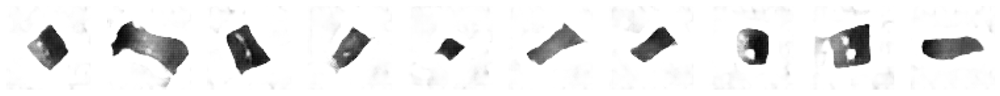

313/313 [==============================] - 333s 1s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 112/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_111.png


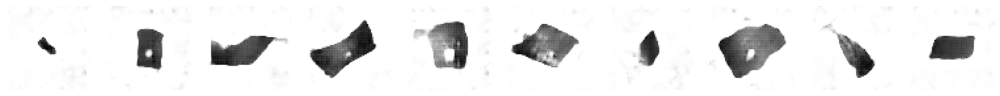

313/313 [==============================] - 332s 1s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 113/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_112.png


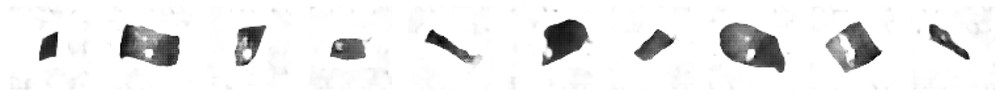

313/313 [==============================] - 332s 1s/step - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 114/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_113.png


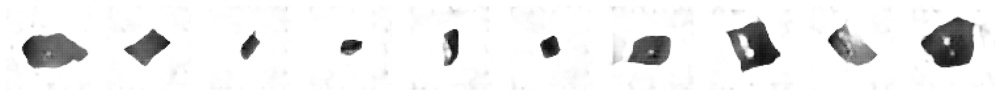

313/313 [==============================] - 332s 1s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 115/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_114.png


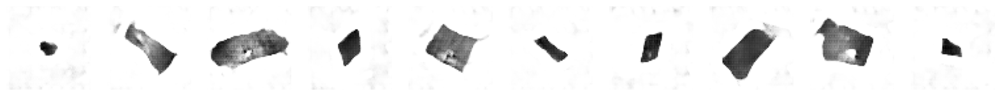

313/313 [==============================] - 333s 1s/step - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 116/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_115.png


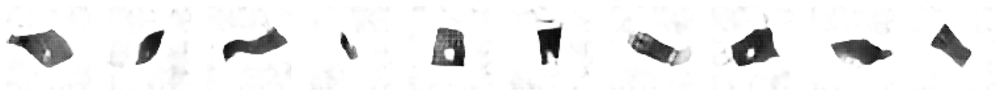

313/313 [==============================] - 334s 1s/step - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 117/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_116.png


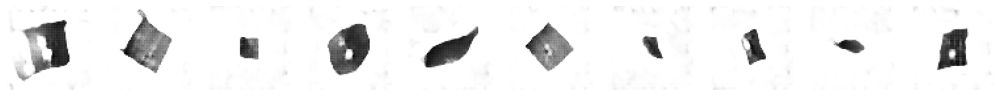

313/313 [==============================] - 334s 1s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 118/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_117.png


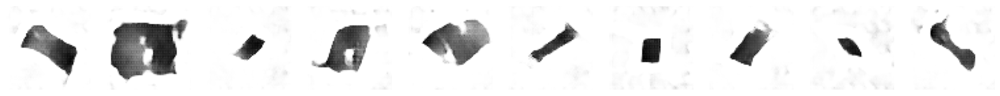

313/313 [==============================] - 333s 1s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 119/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_118.png


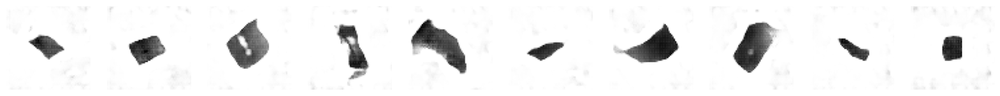

313/313 [==============================] - 333s 1s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 120/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_119.png


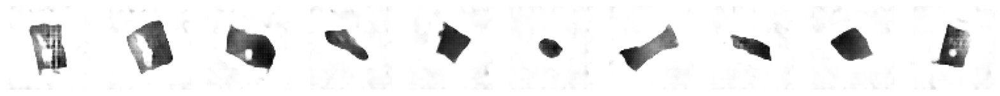

313/313 [==============================] - 334s 1s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 121/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7150 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_120.png


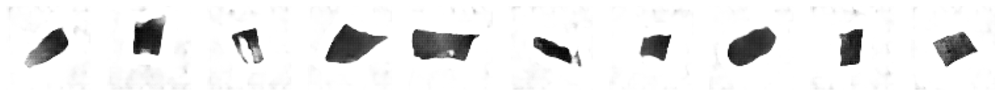

313/313 [==============================] - 334s 1s/step - d_loss: 7.7150 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 122/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_121.png


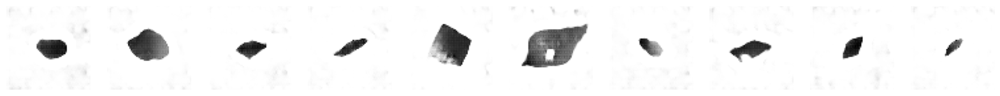

313/313 [==============================] - 334s 1s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 123/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7140 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_122.png


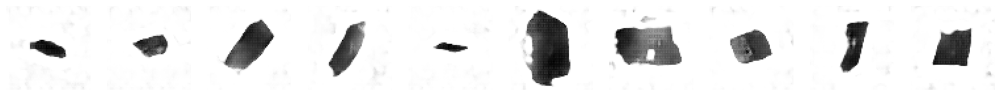

313/313 [==============================] - 334s 1s/step - d_loss: 7.7140 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 124/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_123.png


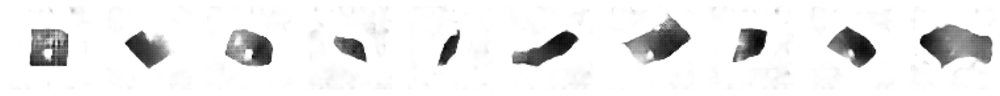

313/313 [==============================] - 334s 1s/step - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 125/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_124.png


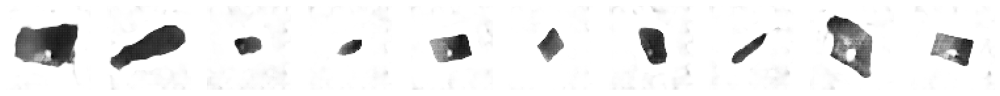

313/313 [==============================] - 334s 1s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 126/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_125.png


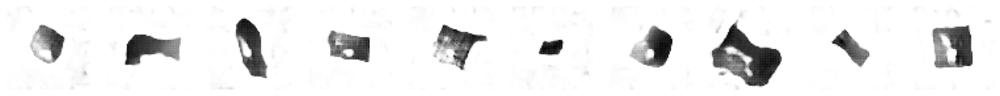

313/313 [==============================] - 334s 1s/step - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 127/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_126.png


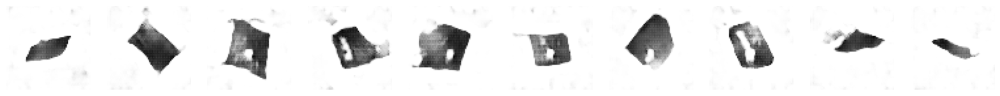

313/313 [==============================] - 337s 1s/step - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 128/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_127.png


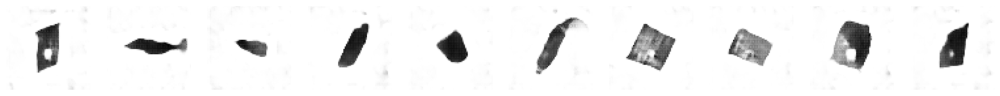

313/313 [==============================] - 336s 1s/step - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 129/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_128.png


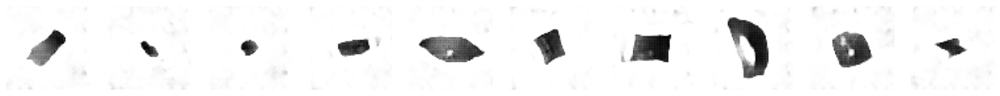

313/313 [==============================] - 335s 1s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 130/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_129.png


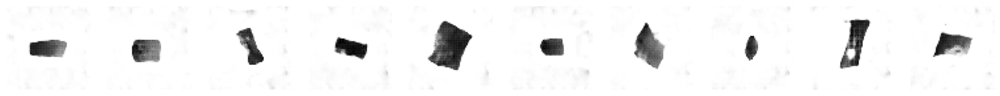

313/313 [==============================] - 335s 1s/step - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 131/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_130.png


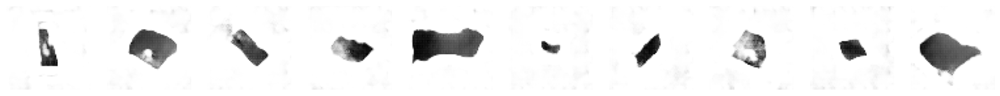

313/313 [==============================] - 335s 1s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 132/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_131.png


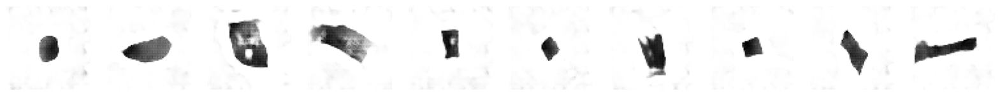

313/313 [==============================] - 335s 1s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 133/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_132.png


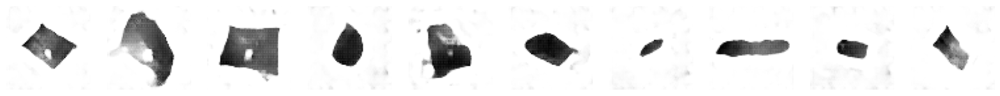

313/313 [==============================] - 335s 1s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 134/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_133.png


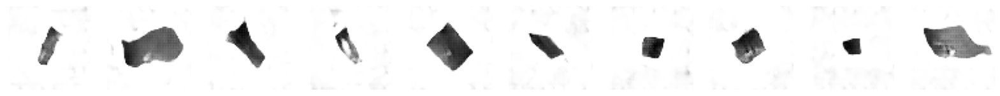

313/313 [==============================] - 335s 1s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 135/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_134.png


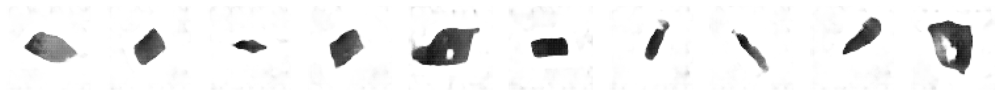

313/313 [==============================] - 335s 1s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 136/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7147 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/04_gan/01_dcgan/output/generated_img_135.png


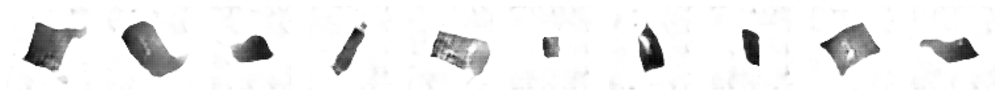

313/313 [==============================] - 335s 1s/step - d_loss: 7.7147 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 137/300
211/313 [===================>..........] - ETA: 1:50 - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00

KeyboardInterrupt: 

In [23]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [24]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

INFO:tensorflow:Assets written to: ./models/generator/assets


INFO:tensorflow:Assets written to: ./models/generator/assets


INFO:tensorflow:Assets written to: ./models/discriminator/assets


INFO:tensorflow:Assets written to: ./models/discriminator/assets


## 3. Generate new images <a name="decode"></a>

In [25]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [26]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

1/1 [==============================] - 0s 152ms/step


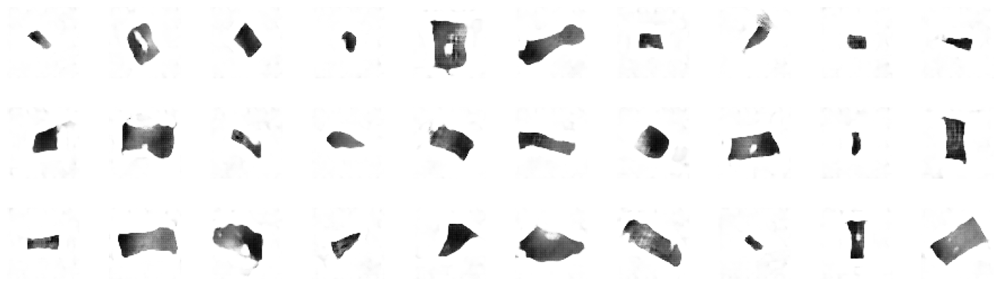

In [27]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [28]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [29]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

1/1 [==============================] - 0s 39ms/step


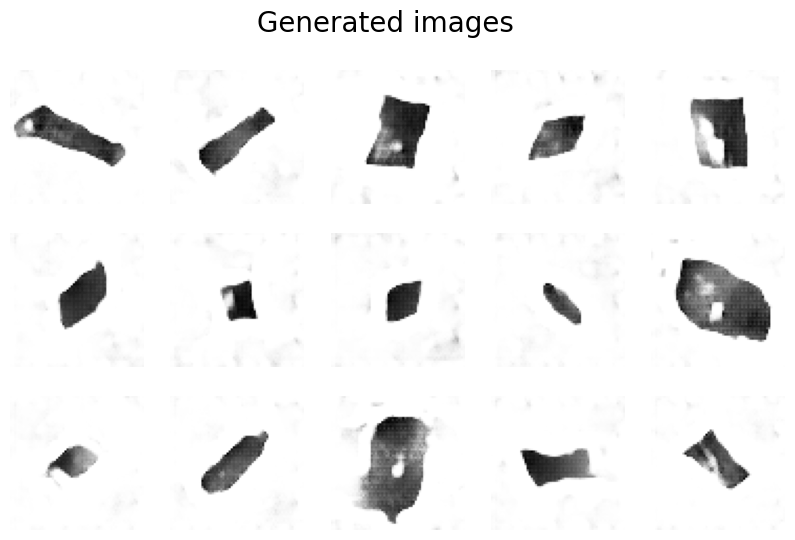

In [30]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

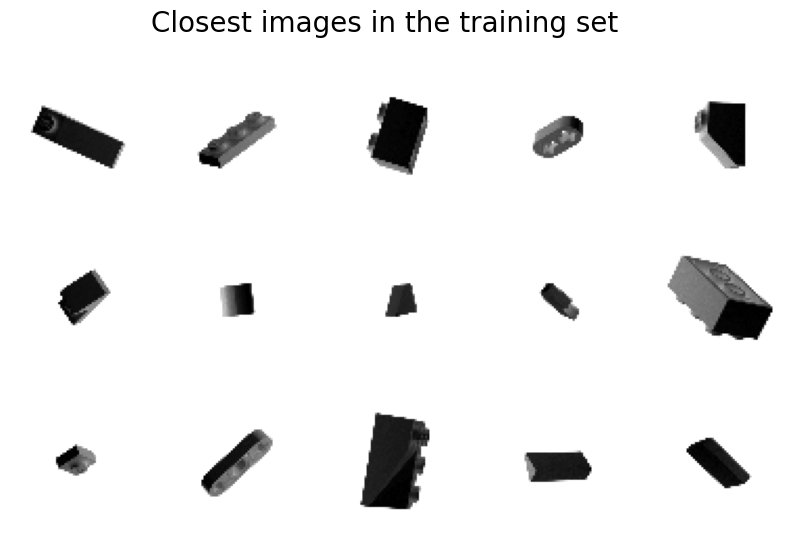

In [31]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()